In [1]:
import os
import pandas as pd
import numpy as np
import plotly.express as px
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import sys
from pathlib import Path

sys.path.insert(0, str(Path().resolve().parent / '.src'))
from plots import plot_rolling_average, plot_hourly_trend, plot_anomalies, plot_mod_cleaning,plot_corr_heatmap,plot_scatter_vs_base
from plots import plot_wind_rose, plot_histograms

from profiling_and_cleaning import plot_outlier_boxplots, add_outlier_flags, report_na_and_duplicates, clean_na_and_duplicates



# Summury statistics and missing value report

In [ ]:
# load data
pd.options.display.float_format = '{:,.2f}'.format
df_data = pd.read_csv('../../../data/benin-malanville.csv', parse_dates=['Timestamp']) # convert the timestamp column to a datetime object

(525600, 19)

In [3]:
print(df_data.dtypes)
print(df_data.describe())

Timestamp        datetime64[ns]
GHI                     float64
DNI                     float64
DHI                     float64
ModA                    float64
ModB                    float64
Tamb                    float64
RH                      float64
WS                      float64
WSgust                  float64
WSstdev                 float64
WD                      float64
WDstdev                 float64
BP                        int64
Cleaning                  int64
Precipitation           float64
TModA                   float64
TModB                   float64
Comments                float64
dtype: object
                           Timestamp        GHI        DNI        DHI  \
count                         525600 525,600.00 525,600.00 525,600.00   
mean   2022-02-07 12:00:30.000000512     240.56     167.19     115.36   
min              2021-08-09 00:01:00     -12.90      -7.80     -12.60   
25%              2021-11-08 06:00:45      -2.00      -0.50      -2.10   
50%          

In [ ]:
report_na_and_duplicates(df_data)# only comments column run has missing values which is fine since they are not of use

Missing Values Report:
           count  percent
Comments  525600   100.00

Number of duplicated rows: 0


In [ ]:


#check data for more than `5%` missing values 
null_percentages =df_data.isna().mean()*100
high_null_percentage = null_percentages[null_percentages > 5]
print(high_null_percentage)# only the comments column
print(df_data.duplicated().sum())#checking for duplicates (none found)

Comments   100.00
dtype: float64
0


# Outlier Detection & Basic Cleaning



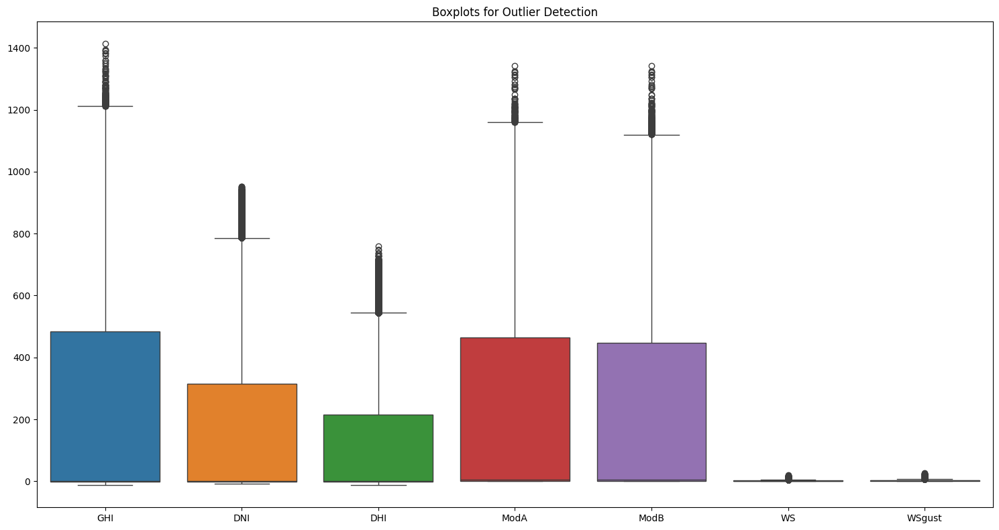

In [6]:
# Checking for outliers using boxplot
plot_outlier_boxplots(df_data, ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust'])



The dots on the upper side of each box show outliers for each column valuses

In [7]:
target_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']
df_data = add_outlier_flags(df_data, target_cols)
df_data

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,...,TModA,TModB,Comments,outlier_GHI,outlier_DNI,outlier_DHI,outlier_ModA,outlier_ModB,outlier_WS,outlier_WSgust
0,2021-08-09 00:01:00,-1.20,-0.20,-1.10,0.00,0.00,26.20,93.40,0.00,0.40,...,26.30,26.20,NaN,False,False,False,False,False,False,False
1,2021-08-09 00:02:00,-1.10,-0.20,-1.10,0.00,0.00,26.20,93.60,0.00,0.00,...,26.30,26.20,NaN,False,False,False,False,False,False,False
2,2021-08-09 00:03:00,-1.10,-0.20,-1.10,0.00,0.00,26.20,93.70,0.30,1.10,...,26.40,26.20,NaN,False,False,False,False,False,False,False
3,2021-08-09 00:04:00,-1.10,-0.10,-1.00,0.00,0.00,26.20,93.30,0.20,0.70,...,26.40,26.30,NaN,False,False,False,False,False,False,False
4,2021-08-09 00:05:00,-1.00,-0.10,-1.00,0.00,0.00,26.20,93.30,0.10,0.70,...,26.40,26.30,NaN,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525595,2022-08-08 23:56:00,-5.50,-0.10,-5.90,0.00,0.00,23.10,98.30,0.30,1.10,...,23.50,22.90,NaN,False,False,False,False,False,False,False
525596,2022-08-08 23:57:00,-5.50,-0.10,-5.80,0.00,0.00,23.10,98.30,0.20,0.70,...,23.50,22.90,NaN,False,False,False,False,False,False,False
525597,2022-08-08 23:58:00,-5.50,-0.10,-5.80,0.00,0.00,23.10,98.40,0.60,1.10,...,23.50,22.90,NaN,False,False,False,False,False,False,False
525598,2022-08-08 23:59:00,-5.50,-0.10,-5.80,0.00,0.00,23.10,98.30,0.90,1.30,...,23.50,22.90,NaN,False,False,False,False,False,False,False


In [ ]:
# since there are no missing values or duplicated values in the data, we can proceed to the next step

df_data.to_csv("../data/benin_malanville_cleaned.csv", index=False)#save the cleaned data

# Time Series Analysis

In [10]:
df_data["Timestamp_date"] =  df_data['Timestamp'].dt.date
df_data_date = df_data.groupby('Timestamp_date')[["GHI", "DNI", "DHI", "Tamb"]].mean()

df_weekly = df_data_date.rolling(window=7).mean()



### Monthly 7 day rolling average pattern analysis

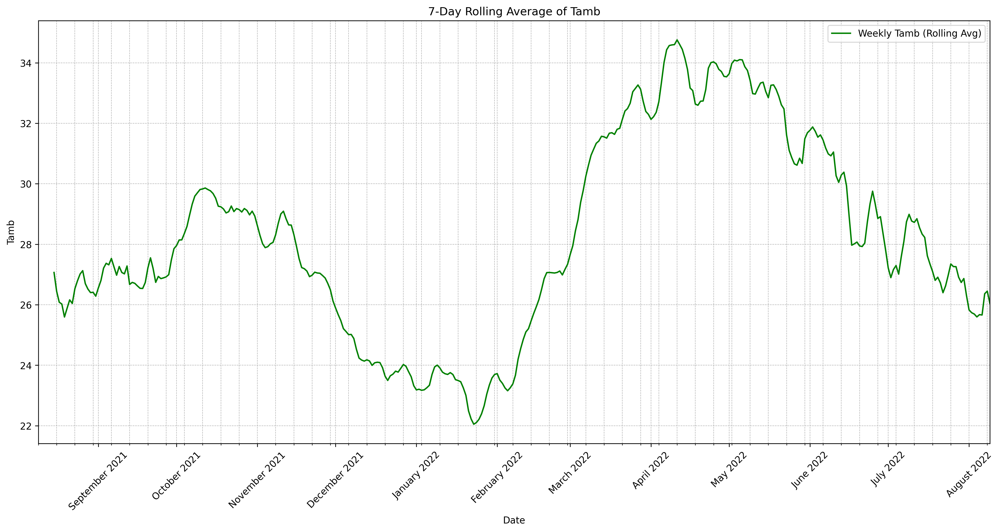

In [11]:
plot_rolling_average(df_weekly, "Tamb", color="green")

This plot shows the weekly rolling average of ambient temperature, highlighting trends and seasonal variations over time.

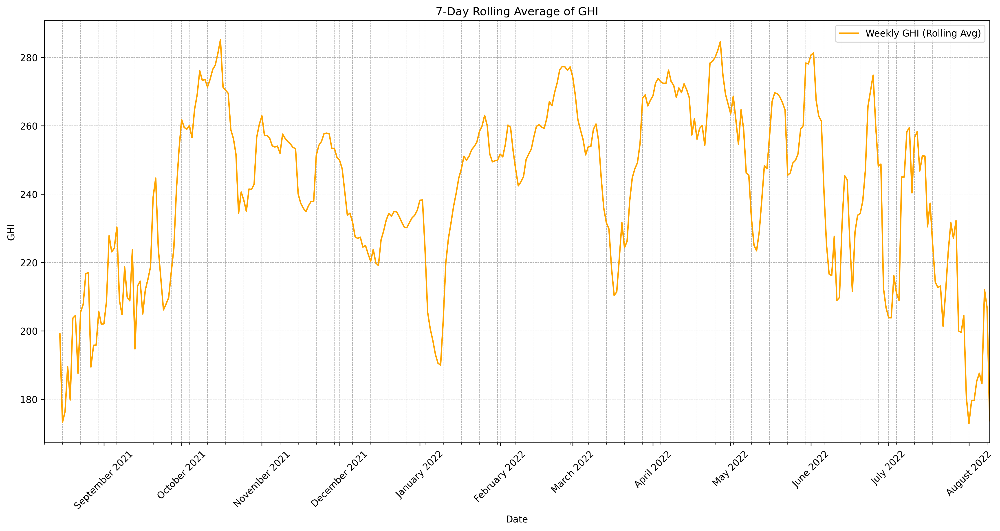

In [32]:
plot_rolling_average(df_weekly, "GHI", color="orange")


This plot displays the weekly rolling average of GHI, illustrating how solar irradiance on a horizontal surface changes throughout the year.

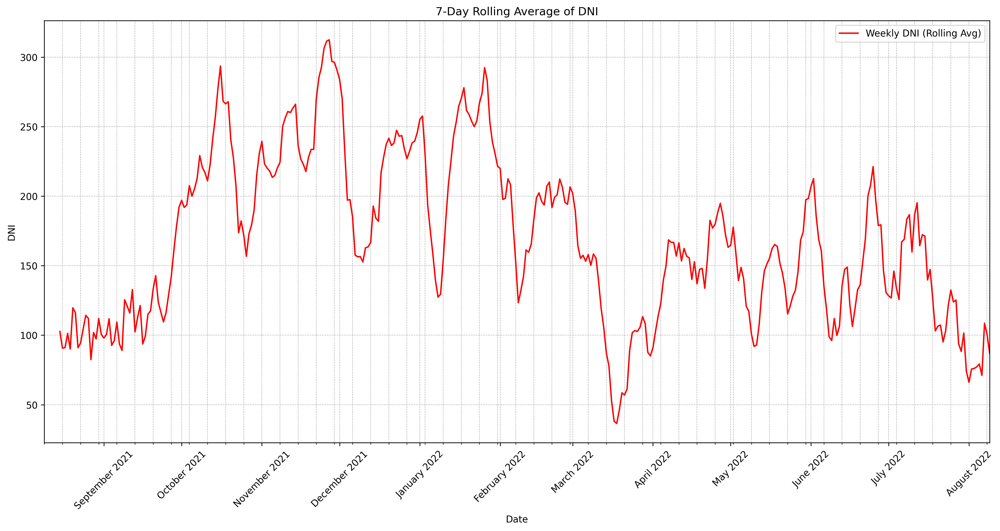

In [13]:
plot_rolling_average(df_weekly, "DNI", color="red")

This plot presents the weekly rolling average of DNI, which represents the amount of solar radiation received per unit area by a surface always held perpendicular to the sun’s rays.

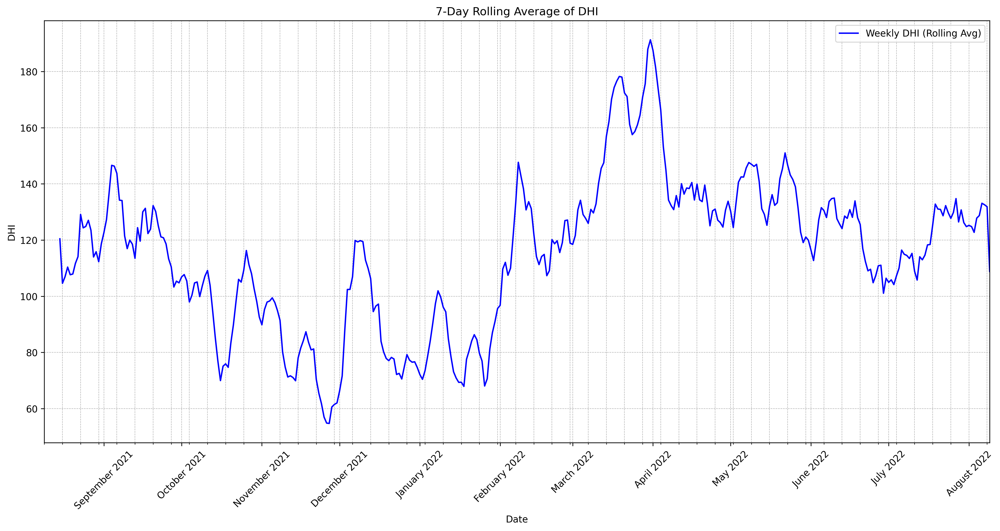

In [14]:
plot_rolling_average(df_weekly, "DHI", color="blue")

This plot shows the weekly rolling average of DHI, indicating the portion of solar radiation received from the sky (excluding direct sunlight).

### Hourly trend analysis 

In [15]:
df_data['hour'] = df_data['Timestamp'].dt.hour # for analysing the hourly trend

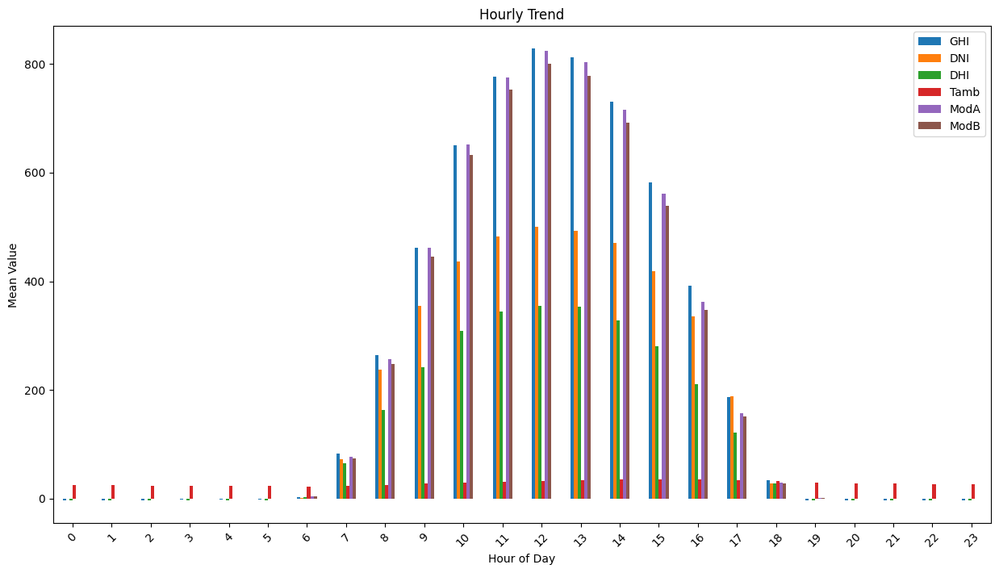

In [16]:
plot_hourly_trend(df_data,["GHI", "DNI", "DHI", "Tamb", "ModA", "ModB"])


Insights: Peak irradiance occurs midday (10 AM–3 PM) with temperature lagging by 1–2 hours. "
        "Wind speeds rise in afternoon due to thermal convection. "
        "Nighttime values near zero (with minor sensor noise).

## Plotting Anomalies trend over key columns

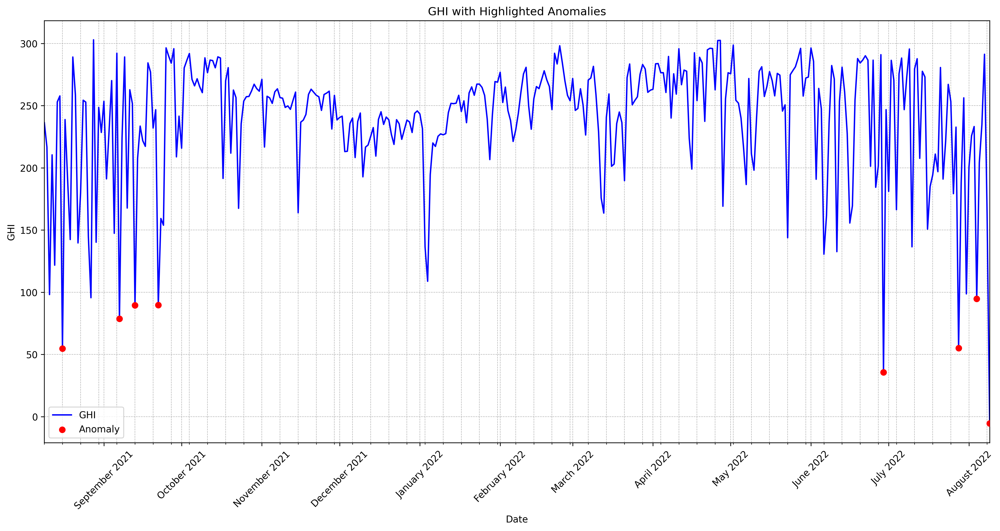

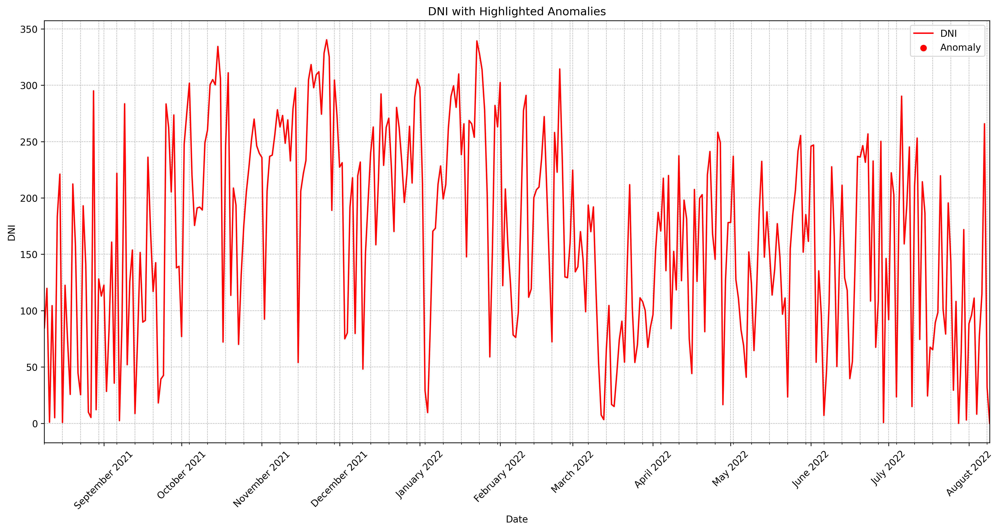

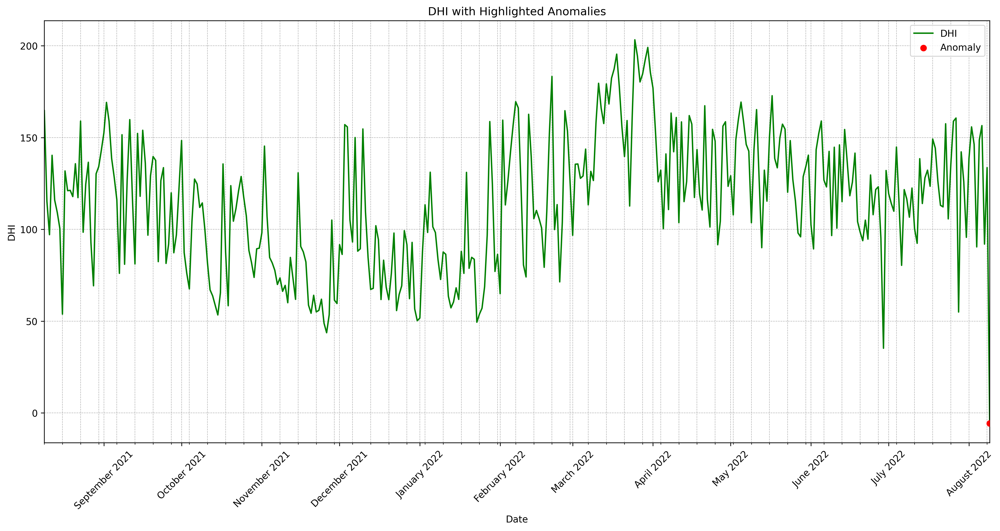

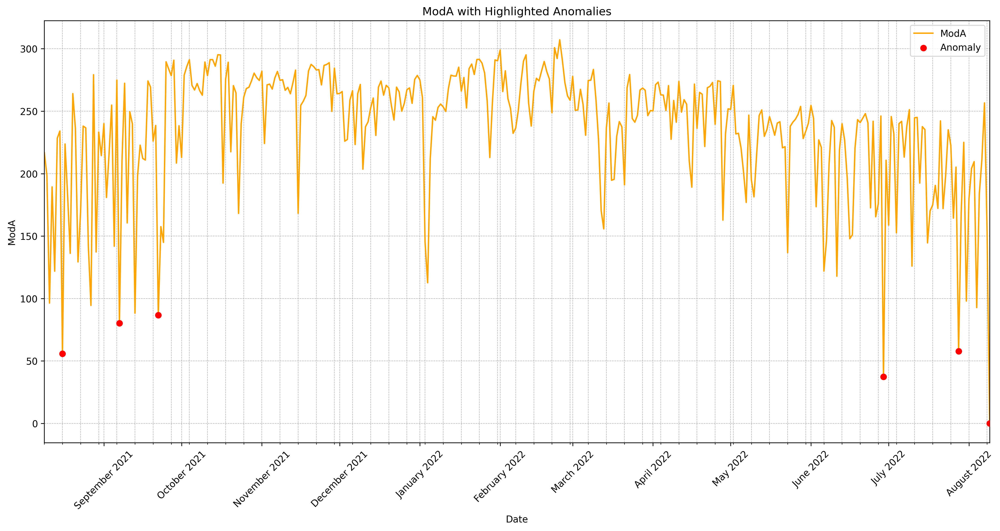

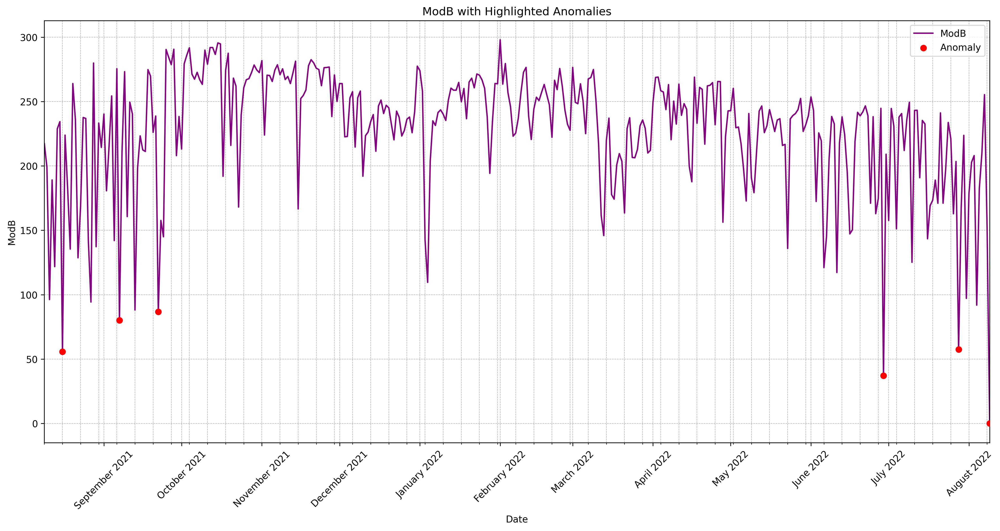

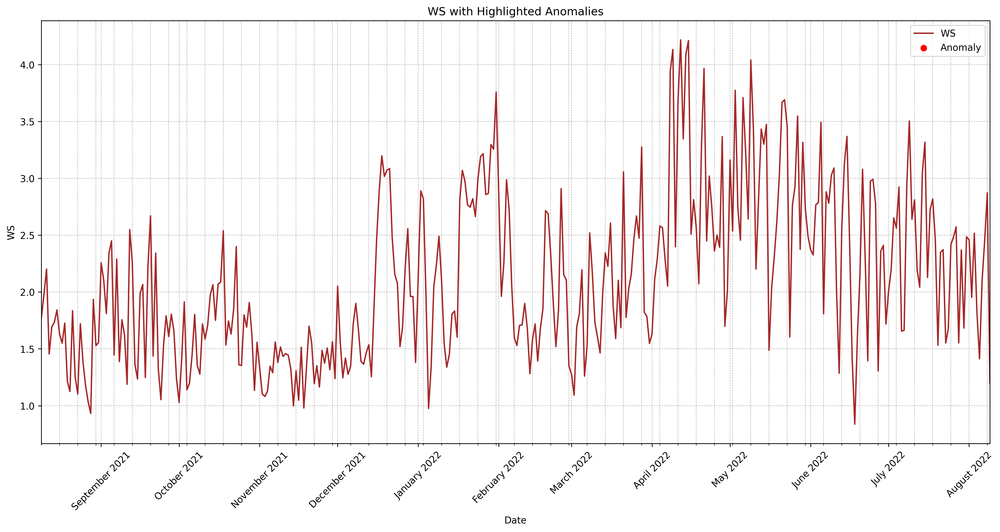

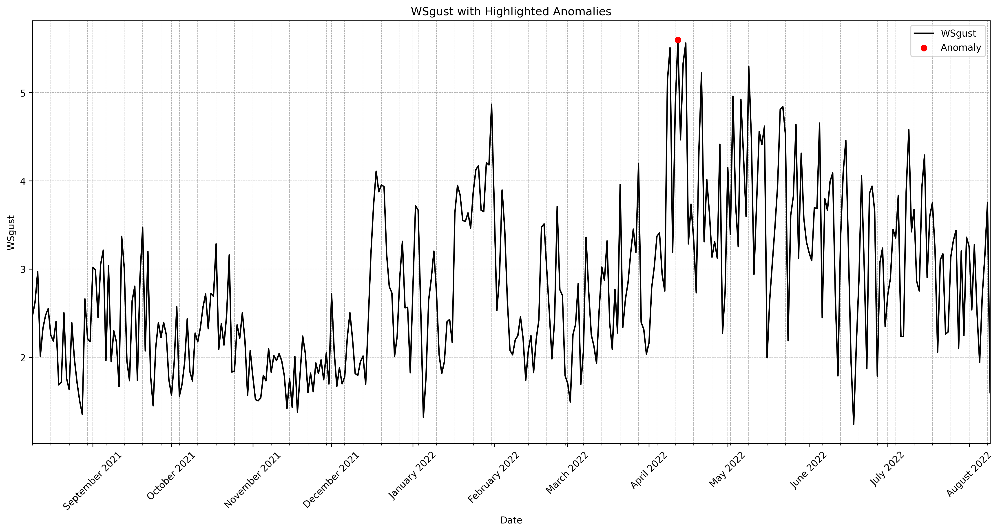

In [17]:
# convert df_data to df_daily for daily analysis as the df_datas hourly data is too large and would make the plot messy
df_daily = df_data.groupby(df_data['Timestamp'].dt.date)[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']].mean().reset_index()
df_daily['Timestamp'] = pd.to_datetime(df_daily['Timestamp'])
target_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']
z_scores = pd.DataFrame(stats.zscore(df_daily[target_cols]), columns=target_cols)
for col in target_cols:
    df_daily[f'outlier_{col}'] = np.abs(z_scores[col]) > 3

colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'black']
index = 0
for col in target_cols:
    color_= colors[index]
    plot_anomalies(df_daily, col, f"outlier_{col}", color= color_)# anomalies highlighted in red in the plots are indicative or outliers 
    index += 1


# cleaning impact


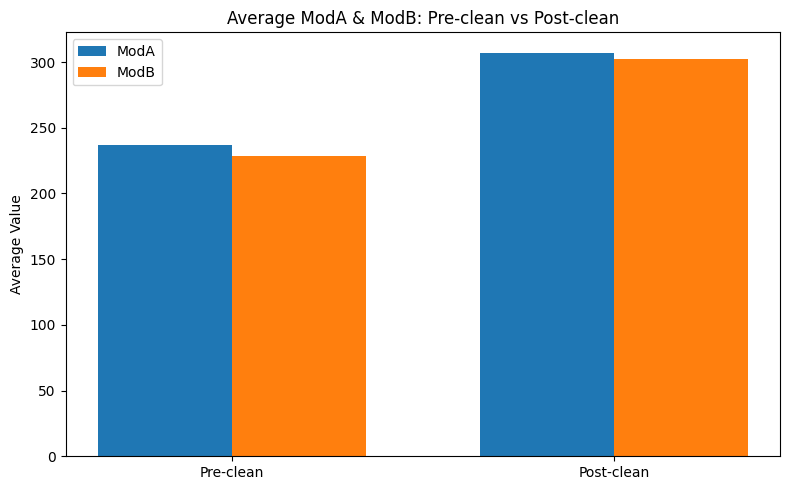

In [18]:
plot_mod_cleaning(df_data)



# Correlation & Relationship Analysis

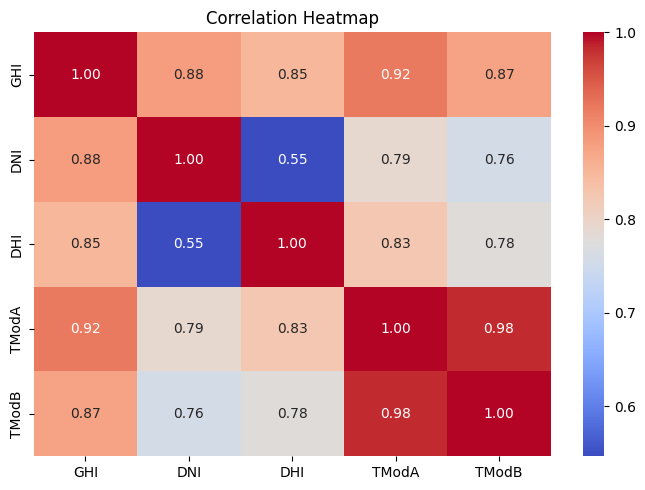

In [19]:
corr_cols = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
plot_corr_heatmap(df_data, corr_cols)


### Correlation Heatmap
This heatmap visualizes the pairwise correlations between GHI, DNI, DHI, TModA, and TModB. Strong positive or negative correlations indicate how closely these variables are related, helping to identify potential dependencies or redundancies in the dataset.

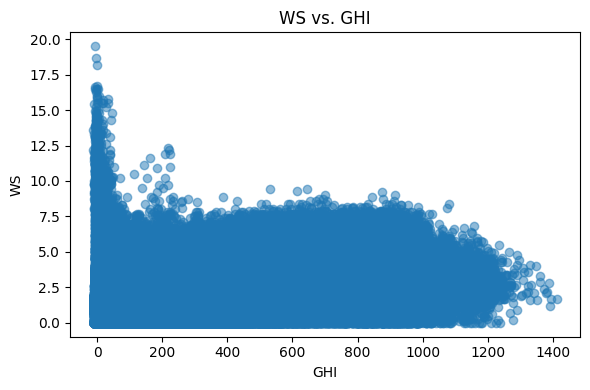

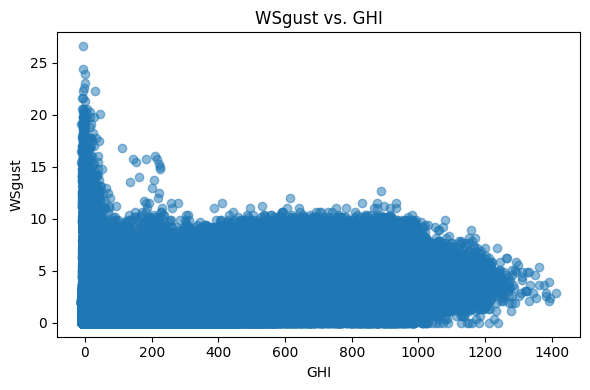

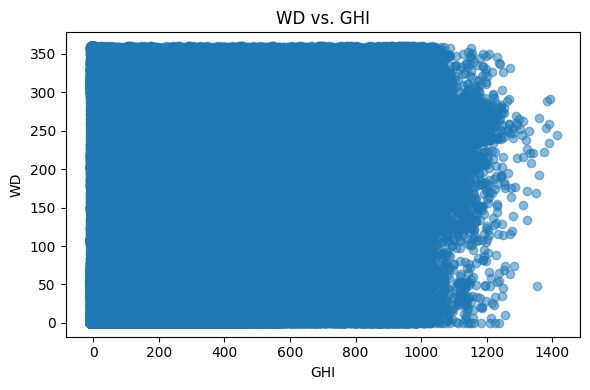

In [20]:
scatter_cols = ['WS', 'WSgust', 'WD']
plot_scatter_vs_base(df_data, scatter_cols, "GHI")

### Scatter Plots: WS, WSgust, WD vs. GHI
These scatter plots show the relationship between wind speed (WS), wind gust (WSgust), and wind direction (WD) with global horizontal irradiance (GHI). Patterns or trends in these plots can reveal how wind characteristics may influence or coincide with solar irradiance levels.

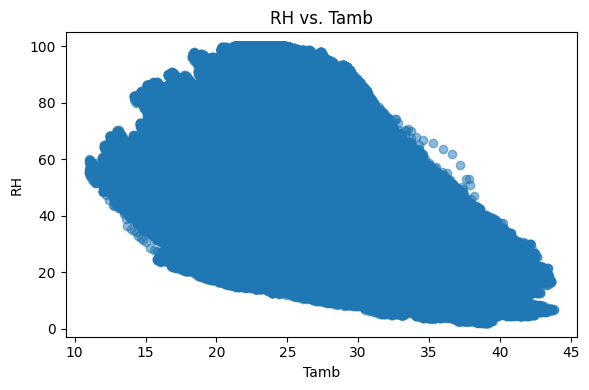

In [21]:
plot_scatter_vs_base(df_data, ["RH"], "Tamb")

### Scatter Plot: RH vs. Tamb
This plot illustrates the relationship between relative humidity (RH) and ambient temperature (Tamb). It helps to explore how humidity varies with temperature, which can be important for understanding atmospheric conditions affecting solar performance.

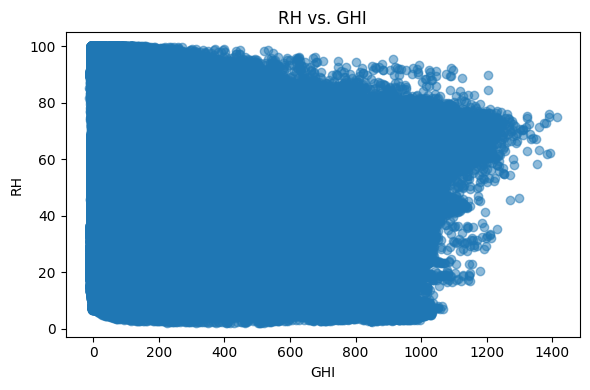

In [22]:
plot_scatter_vs_base(df_data, ["RH"], "GHI")

### Scatter Plot: RH vs. GHI
This plot displays the relationship between relative humidity (RH) and global horizontal irradiance (GHI). It can reveal whether higher humidity levels are associated with changes in solar irradiance, potentially due to cloud cover or atmospheric moisture.

# Wind & Distribution Analysis

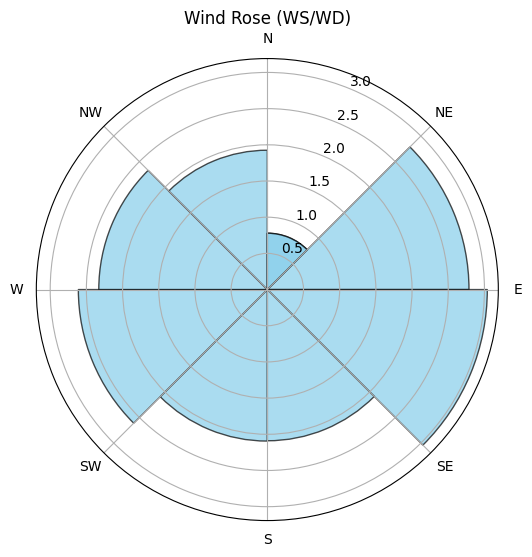

In [23]:
plot_wind_rose(df_data, ws_col='WS', wd_col='WD', bins=8)

A wind rose is a circular plot that shows how wind speed and direction are distributed at a location over a period of time. Each "spoke" represents wind coming from a particular direction, and the length and color of each segment indicate how frequently and how strongly the wind blows from that direction.

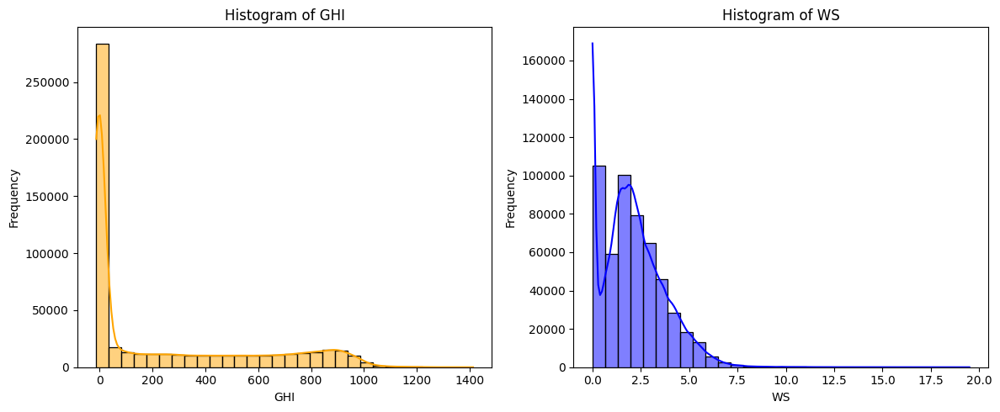

In [24]:
plot_histograms(df_data, ['GHI', 'WS'], bins=30, kde=True, colors=['orange', 'blue'])

# Temperature Analysis

In [25]:
print("Correlation between RH and Tamb:", df_data['RH'].corr(df_data['Tamb']))
print("Spearman correlation between RH and GHI:", df_data['RH'].corr(df_data['GHI'], method='spearman'))

Correlation between RH and Tamb: -0.4148417749799561
Spearman correlation between RH and GHI: -0.1579195469887372


we can thus see that there is an iverse relation between RH (relative humnidity) and Tamb(ambient tempreture) and GHI (solar radiance)

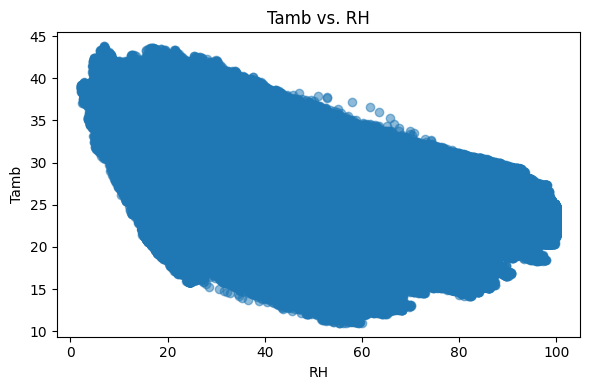

In [ ]:
plot_scatter_vs_base(df_data, ["Tamb"], "RH")

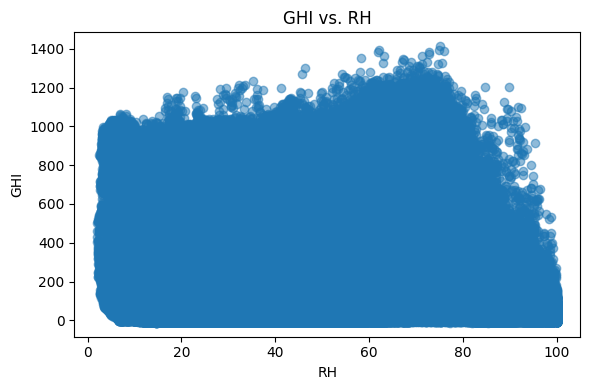

In [27]:
plot_scatter_vs_base(df_data, ["GHI"], "RH")

since the plot doesn't really show a negative corelation between GHI and RH we will use a regression plot below

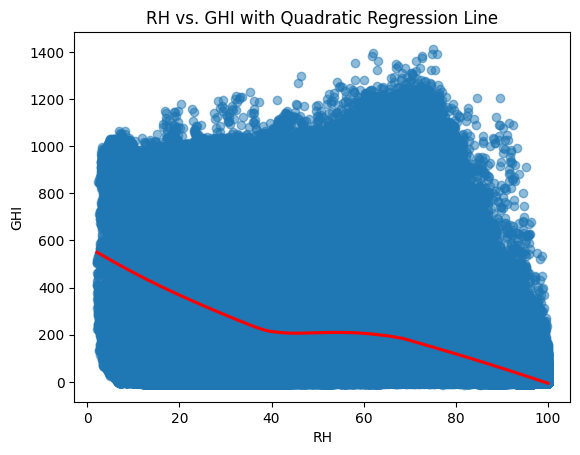

In [34]:
# non-leniar regression line for better representation
sns.regplot(x='RH', y='GHI', data=df_data, lowess=True, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('RH vs. GHI with Quadratic Regression Line')
plt.show()

# Bubble Chart


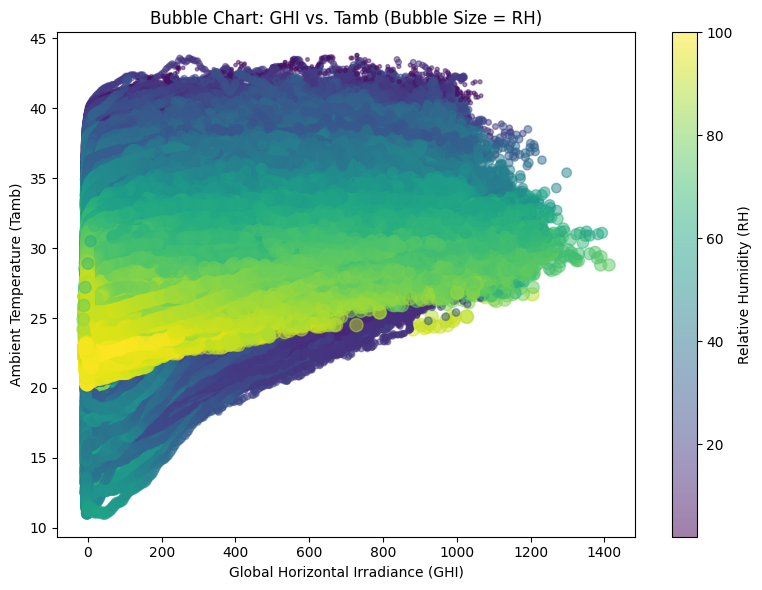

In [29]:
plt.figure(figsize=(8, 6))
plt.scatter(
    df_data['GHI'], 
    df_data['Tamb'], 
    s=df_data['RH'],  # Bubble size by RH (try 'BP' for barometric pressure)
    alpha=0.5, 
    c=df_data['RH'],  # Optional: color by RH for extra info
    cmap='viridis'
)
plt.xlabel('Global Horizontal Irradiance (GHI)')
plt.ylabel('Ambient Temperature (Tamb)')
plt.title('Bubble Chart: GHI vs. Tamb (Bubble Size = RH)')
cbar = plt.colorbar()
cbar.set_label('Relative Humidity (RH)')
plt.tight_layout()
plt.show()

## Bubble Chart: GHI vs. Tamb with Bubble Size = RH
This bubble chart visualizes the relationship between global horizontal irradiance (GHI) and ambient temperature (Tamb), with each point’s size and color representing relative humidity (RH). Larger and darker bubbles indicate higher humidity. This plot helps reveal how humidity levels may interact with temperature and solar irradiance, highlighting multi-dimensional dependencies in the data.